# Week 14: Raster Data in the Wild

- Section 401
- Dec 6, 2023

In [1]:
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd

In [2]:
np.seterr("ignore");

## Last two lectures! 

**Raster data analysis with the holoviz ecosystem**

Two case studies:

- Using satellite imagery to detect changes in lake volume
- Detecting urban heat islands in Philadelphia

## The decline of the world's saline lakes

- A 2017 study that looked at the volume decline of many of the world's saline lakes
- Primarily due to water diversion and climate change
- Estimate the amount of inflow required to sustain these ecosystems
- Copy of the study [available in this week's repository](decline_of_saline_lakes.pdf)

Some examples...

## The Aral Sea in Kazakhstan

### 2000

<img src="imgs/aral-1.jpeg" width=700></img>

### 2018
<img src="imgs/aral-2.jpeg" width=700></img>

Source: [https://earthobservatory.nasa.gov/world-of-change/AralSea](https://earthobservatory.nasa.gov/world-of-change/AralSea)

## Lake Urmia in Iran

### 1998
<img src="imgs/urmia-1.jpeg" width=700></img>

### 2011
<img src="imgs/urmia-2.jpeg" width=700></img>

Source: [https://earthobservatory.nasa.gov/images/76327/lake-orumiyeh-iran](https://earthobservatory.nasa.gov/images/76327/lake-orumiyeh-iran)

## Today: Walker Lake

### 1988

<img src="imgs/walker-1.jpeg" width=700></img>

### 2017

<img src="imgs/walker-2.jpeg" width=700><img>

Source: [https://earthobservatory.nasa.gov/images/91921/disappearing-walker-lake](https://earthobservatory.nasa.gov/images/91921/disappearing-walker-lake)

### Let's analyze this in Python!

In [3]:
import intake
import xarray as xr

# hvplot
import hvplot.xarray
import hvplot.pandas

In [4]:
import holoviews as hv
import geoviews as gv
from geoviews.tile_sources import EsriImagery

### First, let's use intake to load the data

Catalog file: [https://github.com/pyviz-topics/EarthML/blob/master/examples/catalog.yml](https://github.com/pyviz-topics/EarthML/blob/master/examples/catalog.yml)

Source: [EarthML](http://earthml.pyviz.org/)

In [5]:
url = 'https://raw.githubusercontent.com/pyviz-topics/EarthML/master/examples/catalog.yml'
cat = intake.open_catalog(url)

In [6]:
list(cat)

['landsat_5_small',
 'landsat_8_small',
 'landsat_5',
 'landsat_8',
 'google_landsat_band',
 'amazon_landsat_band',
 'fluxnet_daily',
 'fluxnet_metadata',
 'seattle_lidar']

We'll focus on the Landsat 5 and 8 small datasets.

These are "small" snapshots around Walker Lake, around cut out of the larger Landsat dataset.

In [7]:
landsat_5 = cat.landsat_5_small()

In [8]:
landsat_5

landsat_5_small:
  args:
    chunks:
      band: 1
      x: 50
      y: 50
    concat_dim: band
    storage_options:
      anon: true
    urlpath: s3://earth-data/landsat/small/LT05_L1TP_042033_19881022_20161001_01_T1_sr_band{band:d}.tif
  description: Small version of Landsat 5 Surface Reflectance Level-2 Science Product.
  driver: intake_xarray.raster.RasterIOSource
  metadata:
    cache:
    - argkey: urlpath
      regex: earth-data/landsat
      type: file
    catalog_dir: https://raw.githubusercontent.com/pyviz-topics/EarthML/master/examples
    plots:
      band_image:
        dynamic: false
        groupby: band
        kind: image
        rasterize: true
        width: 400
        x: x
        y: y


### Intake let's you define "default" plots for a dataset

Leveraging the power of hvplot under the hood...

In [9]:
landsat_5.hvplot.band_image()

0/|/LT05_L1TP_042033_19881022_20161001_01_T1_sr_band1.tif: |

0/|/LT05_L1TP_042033_19881022_20161001_01_T1_sr_band5.tif: |

0/|/LT05_L1TP_042033_19881022_20161001_01_T1_sr_band3.tif: |

0/|/LT05_L1TP_042033_19881022_20161001_01_T1_sr_band7.tif: |

0/|/LT05_L1TP_042033_19881022_20161001_01_T1_sr_band4.tif: |

0/|/LT05_L1TP_042033_19881022_20161001_01_T1_sr_band2.tif: |

:HoloMap   [band]
   :Image   [x,y]   (value)

### What's happening under the hood?

In [10]:
landsat_5.hvplot.image(
    x="x",
    y="y",
    groupby="band",
    rasterize=True,
    frame_width=400,
    frame_height=400,
    geo=True,
    crs=32611,
)

:DynamicMap   [band]
   :Image   [x,y]   (value)

### We can do the same for the Landsat 8 data

In [12]:
landsat_8 = cat.landsat_8_small()

In [13]:
landsat_8.hvplot.image(
    x="x",
    y="y",
    groupby="band",
    rasterize=True,
    frame_width=400,
    frame_height=400,
    geo=True,
    crs=32611,
)

0/|/LC08_L1TP_042033_20171022_20171107_01_T1_sr_band5.tif: |

0/|/LC08_L1TP_042033_20171022_20171107_01_T1_sr_band4.tif: |

0/|/LC08_L1TP_042033_20171022_20171107_01_T1_sr_band3.tif: |

0/|/LC08_L1TP_042033_20171022_20171107_01_T1_sr_band1.tif: |

0/|/LC08_L1TP_042033_20171022_20171107_01_T1_sr_band6.tif: |

0/|/LC08_L1TP_042033_20171022_20171107_01_T1_sr_band7.tif: |

0/|/LC08_L1TP_042033_20171022_20171107_01_T1_sr_band2.tif: |

:DynamicMap   [band]
   :Image   [x,y]   (value)

### We can use dask to read the data

This will return an `xarray` `DataArray` where the values are stored as `dask` arrays.

In [14]:
landsat_5_da = landsat_5.to_dask()
landsat_8_da = landsat_8.to_dask()

In [15]:
landsat_5_da

<xarray.DataArray (band: 6, y: 300, x: 300)>
array([[[ 640.,  842.,  864., ..., 1250.,  929., 1111.],
        [ 796.,  774.,  707., ..., 1136.,  906., 1065.],
        [ 975.,  707.,  908., ..., 1386., 1249., 1088.],
        ...,
        [1243., 1202., 1160., ..., 1132., 1067.,  845.],
        [1287., 1334., 1292., ...,  801.,  934.,  845.],
        [1550., 1356., 1314., ..., 1309., 1636., 1199.]],

       [[ 810., 1096., 1191., ..., 1749., 1266., 1411.],
        [1096., 1048.,  905., ..., 1556., 1217., 1411.],
        [1286., 1000., 1286., ..., 1749., 1604., 1411.],
        ...,
        [1752., 1565., 1566., ..., 1502., 1456., 1078.],
        [1752., 1799., 1706., ...,  983., 1172., 1077.],
        [1893., 1753., 1754., ..., 1736., 2250., 1736.]],

       [[1007., 1345., 1471., ..., 2102., 1462., 1719.],
        [1260., 1259., 1175., ..., 1847., 1419., 1719.],
        [1555., 1175., 1555., ..., 2059., 1889., 1760.],
        ...,
...
        ...,
        [2429., 2138., 2041., ..., 2175., 1885., 1301.],
        [2381., 2333., 2382., ..., 1204., 1495., 1301.],
        [2478., 2041., 2333., ..., 2755., 3431., 2223.]],

       [[1819., 2596., 2495., ..., 2429., 1785., 2023.],
        [2259., 2359., 1885., ..., 2158., 1684., 1921.],
        [2865., 2291., 2664., ..., 2057., 1955., 2057.],
        ...,
        [3081., 2679., 2612., ..., 2499., 2098., 1395.],
        [2779., 2544., 2779., ..., 1429., 1596., 1496.],
        [3183., 2309., 2679., ..., 3067., 3802., 2665.]],

       [[1682., 2215., 2070., ..., 2072., 1440., 1780.],
        [1876., 1973., 1633., ..., 1926., 1586., 1635.],
        [2409., 1924., 2215., ..., 1829., 1780., 1829.],
        ...,
        [2585., 2296., 2296., ..., 2093., 1710., 1134.],
        [2393., 2344., 2489., ..., 1182., 1374., 1326.],
        [2826., 2007., 2393., ..., 2860., 3724., 2333.]]])
Coordinates:
  * band         (band) int32 1 2 3 4 5 7
  * x            (x) float64 3.324e+05 3.326e+05 ... 3.771e+05 3.772e+05
  * y            (y) float64 4.309e+06 4.309e+06 ... 4.264e+06 4.264e+06
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:  Area
    scale_factor:   1.0
    add_offset:     0.0

### Use ".values" to convert to a numpy array

In [15]:
landsat_5_da.shape

(6, 300, 300)

In [16]:
landsat_5_da.values

array([[[ 640.,  842.,  864., ..., 1250.,  929., 1111.],
        [ 796.,  774.,  707., ..., 1136.,  906., 1065.],
        [ 975.,  707.,  908., ..., 1386., 1249., 1088.],
        ...,
        [1243., 1202., 1160., ..., 1132., 1067.,  845.],
        [1287., 1334., 1292., ...,  801.,  934.,  845.],
        [1550., 1356., 1314., ..., 1309., 1636., 1199.]],

       [[ 810., 1096., 1191., ..., 1749., 1266., 1411.],
        [1096., 1048.,  905., ..., 1556., 1217., 1411.],
        [1286., 1000., 1286., ..., 1749., 1604., 1411.],
        ...,
        [1752., 1565., 1566., ..., 1502., 1456., 1078.],
        [1752., 1799., 1706., ...,  983., 1172., 1077.],
        [1893., 1753., 1754., ..., 1736., 2250., 1736.]],

       [[1007., 1345., 1471., ..., 2102., 1462., 1719.],
        [1260., 1259., 1175., ..., 1847., 1419., 1719.],
        [1555., 1175., 1555., ..., 2059., 1889., 1760.],
        ...,
        [2090., 1840., 1798., ..., 1828., 1703., 1242.],
        [2048., 2049., 2008., ..., 1074., 132

::: {.callout-important}

- EPSG 32611 is the default CRS for Landsat data
- Units are meters

:::

### Evidence of shrinkage?

- We want to compare the images across time.
- Data for Landsat 8 is from 2017
- Data for Landat 5 is from 1988

**Problem:** they appear to cover different areas

### First: Let's plot RGB images of the two datasets

See [lecture 5B](https://musa-550-fall-2023.github.io/content/week-5/lecture-5B.html#part-1-getting-started-with-rasterio) for a reminder! 

**Hints**
- We want to use the `earthpy` package to do the plotting.
- We can use the `data.sel(band=bands)` syntax to select specific bands from the dataset, where bands is a list of the desired bands to be selected.

#### Important notes

* For Landsat 5, the RGB bands are bands 3, 2, and 1, respectively.
* For Landsat 8, the RGB bands are bands 4, 3, and 2, respectively.
* Reference: [Landsat 5](https://www.usgs.gov/land-resources/nli/landsat/landsat-5) and [Landsat 8](https://landsat.gsfc.nasa.gov/landsat-8/landsat-8-bands/)

In [16]:
import earthpy.plot as ep

#### Landsat 8 color image

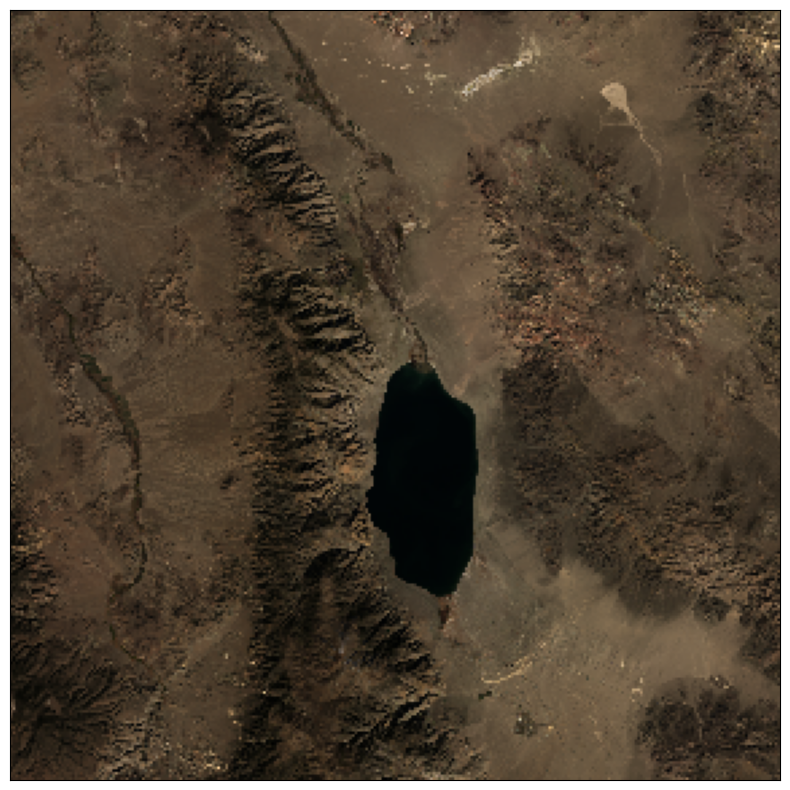

In [17]:
# Get the RGB data from landsat 8 dataset as a numpy array
rgb_data_8 = landsat_8_da.sel(band=[4,3,2]).values

# # Initialize
fig, ax = plt.subplots(figsize=(10,10))

# # Plot the RGB bands
ep.plot_rgb(rgb_data_8, rgb=(0, 1, 2), ax=ax);

#### Landsat 5 color image

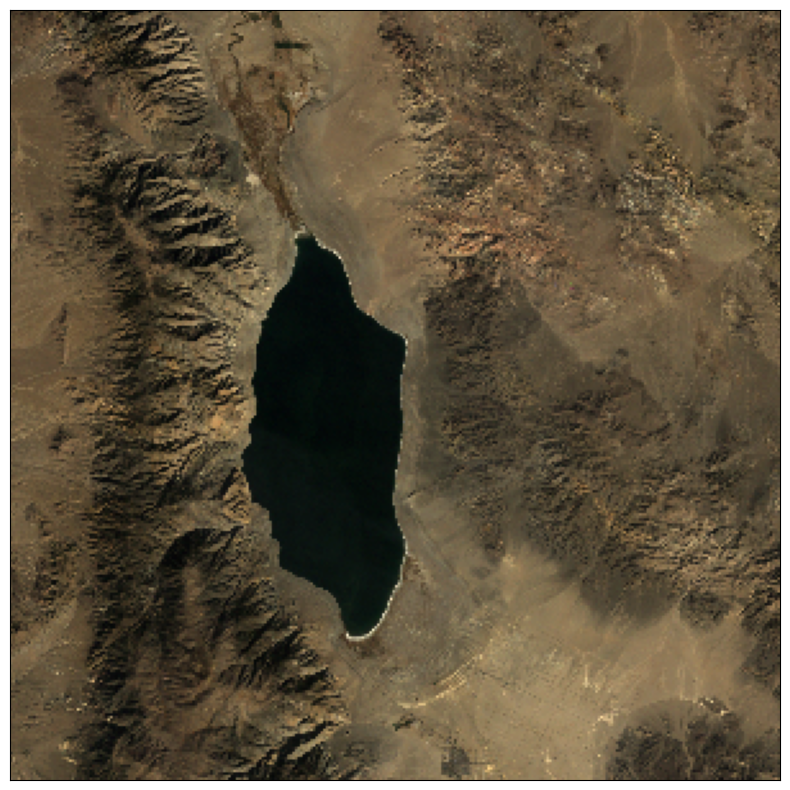

In [18]:
# Get the RGB data from landsat 5 dataset as a numpy array
rgb_data_5 = landsat_5_da.sel(band=[3,2,1]).values

# # Initialize
fig, ax = plt.subplots(figsize=(10,10))

# # Plot the RGB bands
ep.plot_rgb(rgb_data_5, rgb=(0, 1, 2), ax=ax);

### Can we trim these to the same areas?

Yes, we can use xarray builtin selection functionality!

The Landsat 5 images is more zoomed in, so let's trim to the Landsat 8 data to this range

Take advantage of the "coordinate" arrays provided by xarray:

In [19]:
landsat_5_da.x

<xarray.DataArray 'x' (x: 300)>
array([332400., 332550., 332700., ..., 376950., 377100., 377250.])
Coordinates:
  * x            (x) float64 3.324e+05 3.326e+05 ... 3.771e+05 3.772e+05
    spatial_ref  int32 0

In [21]:
landsat_5_da.y

<xarray.DataArray 'y' (y: 300)>
array([4309200., 4309050., 4308900., ..., 4264650., 4264500., 4264350.])
Coordinates:
  * y            (y) float64 4.309e+06 4.309e+06 ... 4.264e+06 4.264e+06
    spatial_ref  int64 0

**Remember**: These coordinates are in units of meters!

Let's get the bounds of the Landsat 5 image:

In [20]:
# x bounds
xmin = landsat_5_da.x.min()
xmax = landsat_5_da.x.max()

# y bounds
ymin = landsat_5_da.y.min()
ymax = landsat_5_da.y.max()

### Slicing with xarray

We can use Python's built-in `slice()` function to slice the data's coordinate arrays and select the subset of the data we want.

More info: [http://xarray.pydata.org/en/stable/indexing.html](http://xarray.pydata.org/en/stable/indexing.html)

### Slicing in Python

- A slice object is used to specify how to slice a sequence. 
- You can specify where to start the slicing, and where to end. You can also specify the step, which allows you to e.g. slice only every other item.

Syntax: `slice(start, end, step)`

More info: [https://www.w3schools.com/python/ref_func_slice.asp](https://www.w3schools.com/python/ref_func_slice.asp)

#### An example

In [21]:
letters = ["a", "b", "c", "d", "e", "f", "g", "h"]

letters[0:5:2]

['a', 'c', 'e']

In [24]:
letters[slice(0, 5, 2)]

['a', 'c', 'e']

### Back to xarray and the Landsat data...

We can use the `.sel()` function to slice our `x` and `y` coordinate arrays!

In [22]:
# slice the x and y coordinates
slice_x = slice(xmin, xmax)
slice_y = slice(ymax, ymin) # IMPORTANT: y coordinate array is in descending order

In [23]:
slice_x

slice(<xarray.DataArray 'x' ()>
array(332400.)
Coordinates:
    spatial_ref  int32 0, <xarray.DataArray 'x' ()>
array(377250.)
Coordinates:
    spatial_ref  int32 0, None)

In [25]:
# Use the .sel() to slice
landsat_8_trimmed = landsat_8_da.sel(x=slice_x, y=slice_y)

::: {.callout-important}
The `y` coordinate is stored in descending order, so the slice should be ordered the same way (from ymax to ymin)
:::

In [26]:
landsat_8_da.y

<xarray.DataArray 'y' (y: 286)>
array([4320900., 4320690., 4320480., ..., 4261470., 4261260., 4261050.])
Coordinates:
  * y            (y) float64 4.321e+06 4.321e+06 ... 4.261e+06 4.261e+06
    spatial_ref  int32 0

### Let's look at the trimmed data

In [27]:
landsat_8_trimmed.shape

(7, 214, 213)

In [28]:
landsat_8_da.shape

(7, 286, 286)

In [29]:
landsat_8_trimmed

<xarray.DataArray (band: 7, y: 214, x: 213)>
array([[[ 730.,  721.,  703., ...,  970., 1059.,  520.],
        [ 700.,  751.,  656., ...,  835., 1248.,  839.],
        [ 721.,  754.,  796., ..., 1065., 1207., 1080.],
        ...,
        [1022.,  949.,  983., ...,  516.,  598.,  676.],
        [ 976.,  757.,  769., ...,  950.,  954.,  634.],
        [ 954., 1034.,  788., ..., 1133.,  662., 1055.]],

       [[ 874.,  879.,  858., ..., 1157., 1259.,  609.],
        [ 860.,  919.,  814., ...,  968., 1523.,  983.],
        [ 896.,  939.,  982., ..., 1203., 1412., 1292.],
        ...,
        [1243., 1157., 1212., ...,  604.,  680.,  805.],
        [1215.,  953.,  949., ..., 1095., 1110.,  755.],
        [1200., 1258.,  978., ..., 1340.,  758., 1189.]],

       [[1181., 1148., 1104., ..., 1459., 1633.,  775.],
        [1154., 1223., 1093., ..., 1220., 1851., 1345.],
        [1198., 1258., 1309., ..., 1531., 1851., 1674.],
        ...,
...
        ...,
        [2652., 2459., 2649., ..., 1190., 1299., 1581.],
        [2547., 1892., 2212., ..., 2284., 2416., 1475.],
        [2400., 2627., 2405., ..., 2469., 1579., 2367.]],

       [[3039., 2806., 2877., ..., 1965., 2367., 1203.],
        [2779., 2799., 2474., ..., 1685., 2339., 1637.],
        [2597., 2822., 2790., ..., 2030., 2587., 2116.],
        ...,
        [3144., 2892., 3168., ..., 1453., 1594., 1765.],
        [3109., 2405., 2731., ..., 2804., 3061., 1653.],
        [2518., 3110., 3144., ..., 2801., 2051., 2770.]],

       [[2528., 2326., 2417., ..., 1748., 2139., 1023.],
        [2260., 2238., 1919., ..., 1519., 2096., 1448.],
        [2041., 2226., 2247., ..., 1848., 2380., 1973.],
        ...,
        [2661., 2423., 2556., ..., 1225., 1335., 1469.],
        [2573., 1963., 2091., ..., 2479., 2570., 1393.],
        [2191., 2525., 2504., ..., 2658., 1779., 2514.]]])
Coordinates:
  * band         (band) int32 1 2 3 4 5 6 7
  * x            (x) float64 3.326e+05 3.328e+05 ... 3.769e+05 3.771e+05
  * y            (y) float64 4.309e+06 4.309e+06 ... 4.265e+06 4.264e+06
    spatial_ref  int32 0
Attributes:
    AREA_OR_POINT:  Area
    scale_factor:   1.0
    add_offset:     0.0

Plot the trimmed Landsat 8 data:

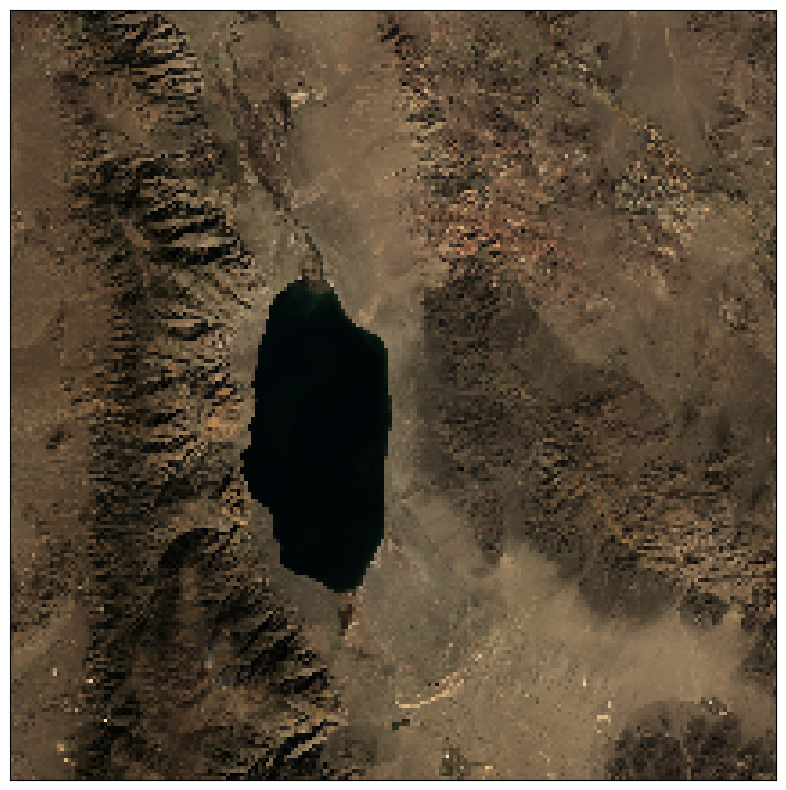

In [30]:
# Get the trimmed landsat 8 RGB data as a numpy array
rgb_data_8 = landsat_8_trimmed.sel(band=[4,3,2]).values

# # Initialize
fig, ax = plt.subplots(figsize=(10,10))

# # Plot the RGB bands
ep.plot_rgb(rgb_data_8, rgb=(0, 1, 2), ax=ax);

Plot the original Landsat 5 data:

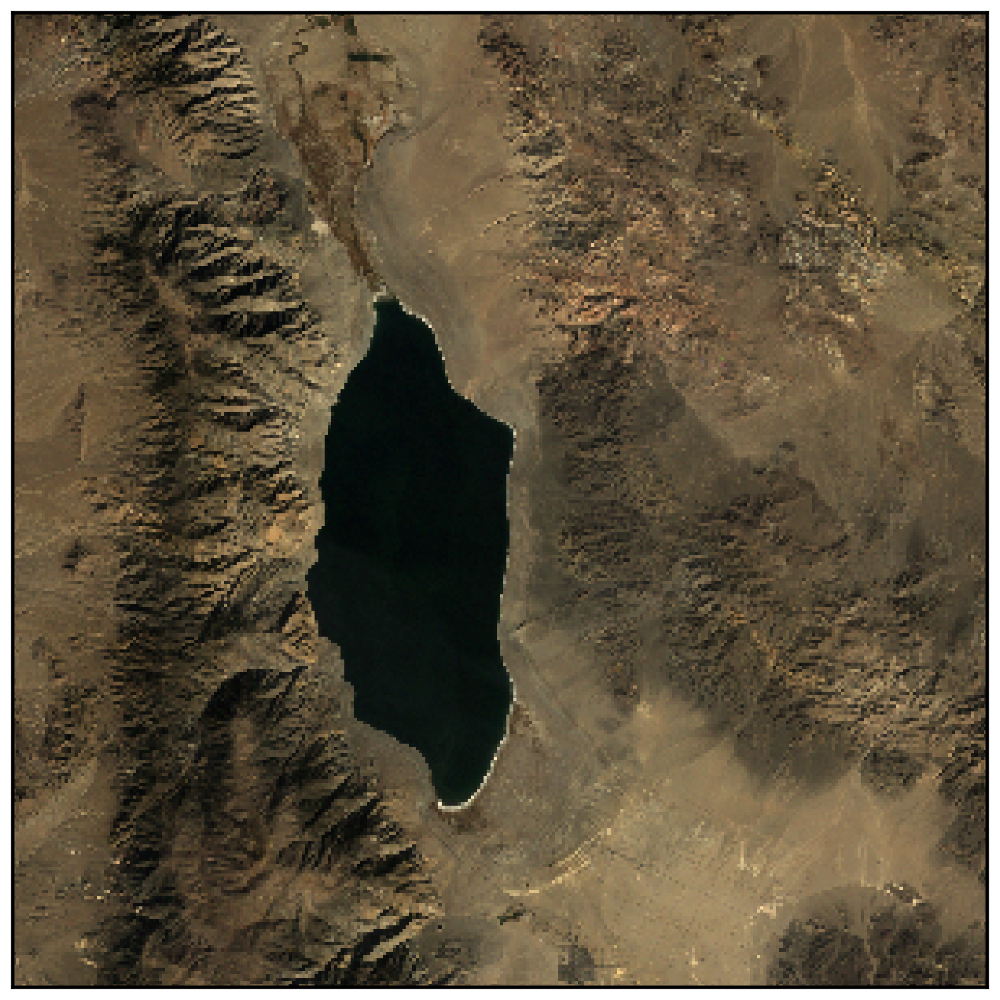

In [33]:
# Select the RGB data as a numpy array
rgb_data_5 = landsat_5_da.sel(band=[3,2,1]).values

# Initialize the figure
fig, ax = plt.subplots(figsize=(10,10))

# Plot the RGB bands
ep.plot_rgb(rgb_data_5, rgb=(0, 1, 2), ax=ax);

Some evidence of shrinkage...but can we do better?

Yes! We'll use the change in the NDVI over time to detect change in lake volume

### Calculate the NDVI for the Landsat 5 (1988) and Landsat 8 (2017) datasets


::: {.callout-note title="Remember"}
- NDVI = (NIR - Red) / (NIR + Red)
- You can once again use the `.sel()` function to select certain bands from the datasets
:::

**For Landsat 5:**
NIR = band 4 and Red = band 3

**For Landsat 8:**
NIR = band 5 and Red = band 4

#### NDVI 1988

In [31]:
NIR_1988 = landsat_5_da.sel(band=4)
RED_1988 = landsat_5_da.sel(band=3)

NDVI_1988 = (NIR_1988 - RED_1988) / (NIR_1988 + RED_1988)

#### NDVI 2017

In [32]:
NIR_2017 = landsat_8_da.sel(band=5)
RED_2017 = landsat_8_da.sel(band=4)

NDVI_2017 = (NIR_2017 - RED_2017) / (NIR_2017 + RED_2017)

#### The difference between 2017 and 1988

- Take the difference between the 2017 NDVI and the 1988 NDVI
- Use the `hvplot.image()` function to show the difference 
- A diverging palette, like `coolwarm`, is particularly useful for this situation

In [33]:
diff = NDVI_2017 - NDVI_1988

diff.hvplot.image(
    x="x",
    y="y",
    frame_height=400,
    frame_width=400,
    cmap="coolwarm",
    clim=(-1, 1),
    geo=True,
    crs=32611,
)

:Image   [x,y]   (value)

In [37]:
NDVI_1988.shape

(300, 300)

In [38]:
NDVI_2017.shape

(286, 286)

In [39]:
diff.shape

(42, 43)

### What's going on here? Why so pixelated?

Two issues:
- Different x/y bounds
- Different resolutions

In [40]:
# Different x/y ranges!
print(NDVI_1988.x[0].values)
print(NDVI_2017.x[0].values)

332400.0
318300.0


In [41]:
# Different resolutions
print((NDVI_1988.x[1] - NDVI_1988.x[0]).values)
print((NDVI_2017.x[1] - NDVI_2017.x[0]).values)

150.0
210.0


### Use xarray to put the data on the same grid

#### First, calculate a bounding box around the center of the data

In [35]:
# The center lat/lng values in EPSG = 4326
# I got these points from google maps 
x0 = -118.7081
y0 = 38.6942

Let's convert these coordinates to the sames CRS as the Landsat data 

We can also use **geopandas**:

In [36]:
pt = pd.DataFrame({"lng": [x0], "lat": [y0]})

In [37]:
gpt = gpd.GeoDataFrame(
    pt, geometry=gpd.points_from_xy(pt["lng"], pt["lat"]), crs="EPSG:4326"
)

gpt

,lng,lat,geometry
0,-118.7081,38.6942,POINT (-118.70810 38.69420)


Convert to the Landsat CRS. Remember: we are converting from EPSG=4326 to EPSG=32611

In [38]:
pt_32611 = gpt.to_crs(epsg=32611)

Let's add a circle with radius 15 km around the midpoint

In [39]:
pt_32611_buffer = pt_32611.copy()
pt_32611_buffer.geometry = pt_32611.geometry.buffer(15e3)  # Add a 15 km radius buffer

#### Did this work?

Use the builting geoviews imagery to confirm..

In [40]:
EsriImagery * pt_32611_buffer.hvplot(alpha=0.4, geo=True, crs=32611)

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]

#### Now, let's set up the grid

In [41]:
res = 200 # 200 meter resolution
x = np.arange(xmin, xmax, res)
y = np.arange(ymin, ymax, res)

In [42]:
len(x)

225

In [43]:
len(y)

225

#### Do the re-gridding

This does a linear interpolation of the data using the nearest pixels.

In [44]:
NDVI_2017_regridded = NDVI_2017.interp(x=x, y=y)
NDVI_1988_regridded = NDVI_1988.interp(x=x, y=y)

#### Plot the re-gridded data side-by-side

In [45]:
img1988 = NDVI_1988_regridded.hvplot.image(
    x="x",
    y="y",
    crs=32611,
    geo=True,
    frame_height=300,
    frame_width=300,
    clim=(-3, 1),
    cmap="fire",
    title="1988"
)


img2017 = NDVI_2017_regridded.hvplot.image(
    x="x",
    y="y",
    crs=32611,
    geo=True,
    frame_height=300,
    frame_width=300,
    clim=(-3, 1),
    cmap="fire",
    title="2017"
)

img1988 + img2017

:Layout
   .Image.I  :Image   [x,y]   (value)
   .Image.II :Image   [x,y]   (value)

Now that the images are lined up, **the change in lake volume is clearly apparent**

In [46]:
diff_regridded = NDVI_2017_regridded - NDVI_1988_regridded
diff_regridded

<xarray.DataArray (y: 225, x: 225)>
array([[ 0.04698485,  0.06277272,  0.04696496, ...,  0.04812127,
        -0.01462977,  0.01676142],
       [ 0.04915427,  0.03146362,  0.02520037, ...,  0.00764362,
         0.02925599,  0.03030879],
       [ 0.05773904,  0.03895859,  0.03848018, ...,  0.04350497,
         0.02471431,  0.03191422],
       ...,
       [ 0.02993016,  0.03760638,  0.03355653, ..., -0.00899765,
         0.0051297 , -0.00335074],
       [ 0.02457032,  0.04594643,  0.03676735, ...,  0.00616795,
        -0.01034597, -0.00197619],
       [ 0.07661604,  0.04792224,  0.04808855, ...,  0.00257181,
        -0.00252524,  0.00854541]])
Coordinates:
    spatial_ref  int32 0
  * x            (x) float64 3.324e+05 3.326e+05 ... 3.77e+05 3.772e+05
  * y            (y) float64 4.264e+06 4.265e+06 ... 4.309e+06 4.309e+06

In [47]:
diff_regridded.hvplot.image(
    x="x",
    y="y",
    crs=32611,
    geo=True,
    frame_height=400,
    frame_width=400,
    cmap="coolwarm",
    clim=(-1, 1),
)

:Image   [x,y]   (value)

#### Takeaway:

The red areas (more vegetation in 2017) show clear loss of lake volume

### One more thing: downsampling hi-res data

Given hi-resolution data, we can downsample to a lower resolution with the familiar groupby / mean framework from pandas

Let's try a resolution of 1000 meters instead of 200 meters

In [55]:
# Define a low-resolution grid
res_1000 = 1000
x_1000 = np.arange(xmin, xmax, res_1000)
y_1000 = np.arange(ymin, ymax, res_1000)

In [56]:
# Groupby new bins and take the mean of all pixels falling into a group
# First: groupby low-resolution x bins and take mean
# Then: groupby low-resolution y bins and take mean
diff_res_1000 = (
    diff_regridded.groupby_bins("x", x_1000, labels=x_1000[:-1])
    .mean(dim="x")
    .groupby_bins("y", y_1000, labels=y_1000[:-1])
    .mean(dim="y")
    .rename(x_bins="x", y_bins="y")
)
diff_res_1000

<xarray.DataArray (y: 44, x: 44)>
array([[0.04441188, 0.05055985, 0.05840989, ..., 0.03623162, 0.02836244,
        0.0223555 ],
       [0.04569241, 0.04080022, 0.04404605, ..., 0.03685891, 0.02847791,
        0.02341687],
       [0.04603897, 0.03883327, 0.04078481, ..., 0.02513061, 0.02298011,
        0.01997115],
       ...,
       [0.03367364, 0.03217862, 0.0394038 , ..., 0.01064314, 0.01451403,
        0.01129917],
       [0.03634618, 0.03259205, 0.03609488, ..., 0.00979841, 0.01484085,
        0.01514796],
       [0.03707802, 0.03183665, 0.04082304, ..., 0.00811861, 0.00924846,
        0.00649866]])
Coordinates:
    spatial_ref  int64 0
  * x            (x) float64 3.324e+05 3.334e+05 ... 3.744e+05 3.754e+05
  * y            (y) float64 4.264e+06 4.265e+06 ... 4.306e+06 4.307e+06

#### Now let's plot the low-resolution version of the difference

In [57]:
diff_res_1000.hvplot.image(
    x="x",
    y="y",
    crs=32611,
    geo=True,
    frame_width=500,
    frame_height=400,
    cmap="coolwarm",
    clim=(-1, 1),
)

:Image   [x,y]   (value)

## Example 2: urban heat islands

- We'll reproduce an analysis by Urban Spatial on urban heat islands in Philadelphia using Python.
- The analysis uses Landsat 8 data (2017)
- See: [http://urbanspatialanalysis.com/urban-heat-islands-street-trees-in-philadelphia/](http://urbanspatialanalysis.com/urban-heat-islands-street-trees-in-philadelphia/)

### First load some metadata for Landsat 8

In [58]:
band_info = pd.DataFrame([
        (1,  "Aerosol", " 0.43 - 0.45",    0.440,  "30",         "Coastal aerosol"),
        (2,  "Blue",    " 0.45 - 0.51",    0.480,  "30",         "Blue"),
        (3,  "Green",   " 0.53 - 0.59",    0.560,  "30",         "Green"),
        (4,  "Red",     " 0.64 - 0.67",    0.655,  "30",         "Red"),
        (5,  "NIR",     " 0.85 - 0.88",    0.865,  "30",         "Near Infrared (NIR)"),
        (6,  "SWIR1",   " 1.57 - 1.65",    1.610,  "30",         "Shortwave Infrared (SWIR) 1"),
        (7,  "SWIR2",   " 2.11 - 2.29",    2.200,  "30",         "Shortwave Infrared (SWIR) 2"),
        (8,  "Panc",    " 0.50 - 0.68",    0.590,  "15",         "Panchromatic"),
        (9,  "Cirrus",  " 1.36 - 1.38",    1.370,  "30",         "Cirrus"),
        (10, "TIRS1",   "10.60 - 11.19",   10.895, "100 * (30)", "Thermal Infrared (TIRS) 1"),
        (11, "TIRS2",   "11.50 - 12.51",   12.005, "100 * (30)", "Thermal Infrared (TIRS) 2")],
    columns=['Band', 'Name', 'Wavelength Range (µm)', 'Nominal Wavelength (µm)', 'Resolution (m)', 'Description']).set_index(["Band"])
band_info

,Name,Wavelength Range (µm),Nominal Wavelength (µm),Resolution (m),Description
Band,,,,,
1,Aerosol,0.43 - 0.45,0.440,30,Coastal aerosol
2,Blue,0.45 - 0.51,0.480,30,Blue
3,Green,0.53 - 0.59,0.560,30,Green
4,Red,0.64 - 0.67,0.655,30,Red
5,NIR,0.85 - 0.88,0.865,30,Near Infrared (NIR)
6,SWIR1,1.57 - 1.65,1.610,30,Shortwave Infrared (SWIR) 1
7,SWIR2,2.11 - 2.29,2.200,30,Shortwave Infrared (SWIR) 2
8,Panc,0.50 - 0.68,0.590,15,Panchromatic
9,Cirrus,1.36 - 1.38,1.370,30,Cirrus


### Landsat data on Google Cloud Storage

We'll be downloading publicly available Landsat data from Google Cloud Storage

See: [https://cloud.google.com/storage/docs/public-datasets/landsat](https://cloud.google.com/storage/docs/public-datasets/landsat)

The relevant information is stored in our intake catalog:

From our catalog.yml file:
```
google_landsat_band:
    description: Landsat bands from Google Cloud Storage
    driver: rasterio
    parameters:
      path:
        description: landsat path
        type: int
      row:
        description: landsat row
        type: int
      product_id:
        description: landsat file id
        type: str
      band:
        description: band
        type: int
    args:
      urlpath: https://storage.googleapis.com/gcp-public-data-landsat/LC08/01/{{ '%03d' % path }}/{{ '%03d' % row }}/{{ product_id }}/{{ product_id }}_B{{ band }}.TIF
      chunks:
        band: 1
        x: 256
        y: 256
```

From the "urlpath" above, you can see we need "path", "row", and "product_id" variables to properly identify a Landsat image:

The path and row corresponding to the area over Philadelphia has already been selected using the [Earth Explorer](https://earthexplorer.usgs.gov/). This tool was also used to find the id of the particular date of interest using the same tool.

In [59]:
# Necessary variables
path = 14
row = 32
product_id = 'LC08_L1TP_014032_20160727_20170222_01_T1'

### An alternative: Google Earth Engine (GEE)

- [A public data archive](https://earthengine.google.com/) of satellite imagery going back more than 40 years.
- A Python API exists for pulling data — good resource if you'd like to work with a large amount of raster data

We won't cover the specifics in the course, but [`geemap`](https://geemap.org/) is a fantastic library for interacting with GEE.

- [Landsat data on GEE](https://developers.google.com/earth-engine/datasets/catalog/landsat/)
- [Example notebooks with videos](https://geemap.org/tutorials/)


#### References 

- Google Earth Engine (GEE):
  - [Documentation](https://earthengine.google.com/)
  - [Data Catalog](https://developers.google.com/earth-engine/datasets/catalog)
  - [Landsat data on Google Earth Engine](https://developers.google.com/earth-engine/datasets/catalog/landsat/)
  - [GEE Guides](https://developers.google.com/earth-engine/guides)
  - [Examples of Python packages for GEE](https://github.com/giswqs/Awesome-GEE#python-api)
- `geemap` package:
  - [Documentation](https://geemap.org/)
  - [GEE tutorials](https://tutorials.geemap.org/)
  - [Example notebooks with videos](https://geemap.org/tutorials/)

### Google Cloud Storage: Use a utility function to query the API and request a specific band

This will return a specific Landsat band as a **dask array.**

In [60]:
from random import random
from time import sleep


def get_band_with_exponential_backoff(path, row, product_id, band, maximum_backoff=32):
    """
    Google Cloud Storage recommends using exponential backoff 
    when accessing the API. 
    
    https://cloud.google.com/storage/docs/exponential-backoff
    """
    n = backoff = 0
    while backoff < maximum_backoff:
        try:
            return cat.google_landsat_band(
                path=path, row=row, product_id=product_id, band=band
            ).to_dask()
        except:
            backoff = min(2 ** n + random(), maximum_backoff)
            sleep(backoff)
            n += 1

### Load all of the bands and combine them into a single xarray DataArray

Loop over each band, load that band using the above function, and then concatenate the results together..

In [61]:
bands = [1, 2, 3, 4, 5, 6, 7, 9, 10, 11]

datasets = []
for band in bands:
    da = get_band_with_exponential_backoff(
        path=path, row=row, product_id=product_id, band=band
    )
    da = da.assign_coords(band=[band])
    datasets.append(da)

ds = xr.concat(datasets, "band", compat="identical")

ds

<xarray.DataArray (band: 10, y: 7871, x: 7741)>
dask.array<concatenate, shape=(10, 7871, 7741), dtype=uint16, chunksize=(1, 256, 256), chunktype=numpy.ndarray>
Coordinates:
  * band         (band) int64 1 2 3 4 5 6 7 9 10 11
  * x            (x) float64 3.954e+05 3.954e+05 ... 6.276e+05 6.276e+05
  * y            (y) float64 4.582e+06 4.582e+06 ... 4.346e+06 4.346e+06
    spatial_ref  int64 0
Attributes:
    AREA_OR_POINT:  Point
    scale_factor:   1.0
    add_offset:     0.0

::: {.callout-important}

CRS for Landsat data is EPSG=32618

:::

### Also grab the metadata from Google Cloud Storage

- There is an associated metadata file stored on Google Cloud Storage
- The below function will parse that metadata file for a specific path, row, and product ID
- The specifics of this are not overly important for our purposes

In [62]:
def load_google_landsat_metadata(path, row, product_id):
    """
    Load Landsat metadata for path, row, product_id from Google Cloud Storage
    """

    def parse_type(x):
        try:
            return eval(x)
        except:
            return x

    baseurl = "https://storage.googleapis.com/gcp-public-data-landsat/LC08/01"
    suffix = f"{path:03d}/{row:03d}/{product_id}/{product_id}_MTL.txt"

    df = intake.open_csv(
        urlpath=f"{baseurl}/{suffix}",
        csv_kwargs={
            "sep": "=",
            "header": None,
            "names": ["index", "value"],
            "skiprows": 2,
            "converters": {"index": (lambda x: x.strip()), "value": parse_type},
        },
    ).read()
    metadata = df.set_index("index")["value"]
    return metadata

In [63]:
metadata = load_google_landsat_metadata(path, row, product_id)
metadata.head()

index
ORIGIN                Image courtesy of the U.S. Geological Survey
REQUEST_ID                                     0501702206266_00020
LANDSAT_SCENE_ID                             LC80140322016209LGN01
LANDSAT_PRODUCT_ID        LC08_L1TP_014032_20160727_20170222_01_T1
COLLECTION_NUMBER                                               01
Name: value, dtype: object

### Exercise: Let's trim our data to the Philadelphia limits

- The Landsat image covers an area *much wider* than the Philadelphia limits
- We'll load the city limits from Open Data Philly
- Use the `slice()` function discussed last example!

#### 1. Load the city limits

- From OpenDataPhilly, the city limits for Philadelphia are available at: [http://data.phl.opendata.arcgis.com/datasets/405ec3da942d4e20869d4e1449a2be48_0.geojson](http://data.phl.opendata.arcgis.com/datasets/405ec3da942d4e20869d4e1449a2be48_0.geojson)
- Be sure to convert to the same CRS as the Landsat data!

#### 2. Use the xmin/xmax and ymin/ymax of the city limits to trim the Landsat DataArray

- Use the built-in slice functionality of xarray
- Remember, the `y` coordinates are in **descending** order, so you'll slice will need to be in descending order as well

#### Step 3: Call the compute() function on your sliced data

- Originally, the Landsat data was stored as dask arrays
- This should now only load the data into memory that covers Philadelphia

This *should* take about a minute or so, depending on the speed of your laptop.

## To be continued!